### Install modules

In [1]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


### Import modules

In [2]:
import os
import pandas as pd
import json
import numpy as np
import seaborn as sns

from matplotlib import pyplot as plt
from matplotlib import patches
from pycocotools.coco import COCO
from PIL import Image

### Custom functions

In [3]:
def img_w_all_bbox(img_num:int, linewidth=5, edgecolors=None, facecolors=None, axis_on_off='off'):
    img_num = str(img_num).zfill(4)
    img_id = f'train/{img_num}.jpg'
    img = Image.open(os.path.join(path_dataset, img_id))
    
    img_df = gt_df[gt_df.img_id==img_id]
    
    # Set bbox edgecolor
    if edgecolors:
        EDGE_COLOR = edgecolors
    else:
        EDGE_COLOR = ['tab:'+col for col in 'blue,orange,green,red,purple,brown,pink,gray,olive,cyan'.split(',')]
    
    map_label_2_edge = {label: color for label, color in zip(np.arange(len(EDGE_COLOR)), EDGE_COLOR)}
    
    # Set bbox facecolor
    if facecolors:
        FACE_COLOR = face_colors
    else:
        FACE_COLOR = ['none' for _ in range(10)]
    map_label_2_face = {label: color for label, color in zip(np.arange(len(FACE_COLOR)), FACE_COLOR)}
    
    # Draw image
    fig, ax = plt.subplots(figsize=(18, 18))
    
    ax.imshow(img)
    
    # Generate given rectangles and add th the Axes
    for idx, row in img_df.iterrows():
        rect = generate_bbox(row, 
                             linewidth=linewidth,
                             edgecolor=map_label_2_edge[row.label],
                             facecolor=map_label_2_face[row.label],
                            )
        
        ax.add_patch(rect)
    
    ax.axis(axis_on_off)        
    plt.show()   
       
    
def generate_bbox(img_info:pd.Series, linewidth, edgecolor, facecolor):    
    return patches.Rectangle((img_info.x1, img_info.y1), img_info.width, img_info.height,
                            linewidth=linewidth, edgecolor=edgecolor, facecolor=facecolor)
    

def img_w_bbox(img_info:pd.Series, linewidth=5, edgecolor='r', facecolor='none', axis_on_off='off'):
    img = Image.open(os.path.join(path_dataset, img_info.img_id))
    
    fig, ax = plt.subplots(figsize=(18, 18))

    ax.imshow(img)
    
    # Generate a rectangle
    rect = generate_bbox(img_info, linewidth, edgecolor, facecolor)

    # Add the patch to the Axes
    ax.add_patch(rect)

    ax.axis(axis_on_off) 
    plt.show()

### Load data & rearange

In [4]:
path_smp_subm = '/opt/ml/detection/sample_submission/' # common path for sample submission diretory
path_dataset = '/opt/ml/detection/dataset/' # common path for dataset directory

with open(os.path.join(path_dataset, 'train.json'), 'r') as outfile:
    gt_json = (json.load(outfile))

GT_JSON = os.path.join(path_dataset, 'train.json')
with open(GT_JSON, 'r') as outfile:
    test_anno = (json.load(outfile))

train_smp_df = pd.read_csv(os.path.join(path_smp_subm, 'train_sample.csv'))
gt_json.keys()

dict_keys(['info', 'licenses', 'images', 'categories', 'annotations'])

In [5]:
# Check annotation format
gt_json['annotations'][0]

{'image_id': 0,
 'category_id': 0,
 'area': 257301.66,
 'bbox': [197.6, 193.7, 547.8, 469.7],
 'iscrowd': 0,
 'id': 0}

In [6]:
coco = COCO(os.path.join(path_dataset, 'train.json'))

gt_list = []

for image_id in coco.getImgIds():
        
    image_info = coco.loadImgs(image_id)[0]
    annotation_id = coco.getAnnIds(imgIds=image_info['id'])
    annotation_info_list = coco.loadAnns(annotation_id)
        
    file_name = image_info['file_name']
        
    for annotation in annotation_info_list:
        gt_list.append([file_name, annotation['category_id'],
                       float(annotation['bbox'][0]),
                       float(annotation['bbox'][0]) + float(annotation['bbox'][2]),
                       float(annotation['bbox'][1]),
                       (float(annotation['bbox'][1]) + float(annotation['bbox'][3]))])


loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


In [7]:
# Check gt_list informations
gt_list[:10]

[['train/0000.jpg', 0, 197.6, 745.4, 193.7, 663.4],
 ['train/0001.jpg', 3, 0.0, 57.6, 407.4, 588.0],
 ['train/0001.jpg', 7, 0.0, 144.6, 455.6, 637.2],
 ['train/0001.jpg', 4, 722.3, 996.5999999999999, 313.4, 565.3],
 ['train/0001.jpg', 5, 353.2, 586.9, 671.0, 774.4],
 ['train/0001.jpg', 5, 3.7, 781.9000000000001, 448.5, 690.5],
 ['train/0001.jpg', 0, 425.3, 641.7, 681.9, 861.7],
 ['train/0001.jpg', 7, 92.4, 231.6, 601.7, 654.8000000000001],
 ['train/0001.jpg', 0, 622.4, 695.1999999999999, 686.5, 780.7],
 ['train/0002.jpg', 3, 267.9, 899.5, 165.2, 678.2]]

In [8]:
gt_df = pd.DataFrame(gt_list, columns=['img_id', 'label', 'x1', 'x2', 'y1', 'y2'])

In [9]:
# Get box size
gt_df['area'] = gt_df.apply(lambda x: (x['y2']-x['y1'])*(x['x2']-x['x1']), axis=1)

# Get box center point
gt_df['cent_x'] = (gt_df.x2+gt_df.x1)/2
gt_df['cent_y'] = (gt_df.y2+gt_df.y1)/2

# Get width and height
gt_df['width'] = gt_df.x2-gt_df.x1
gt_df['height'] = gt_df.y2-gt_df.y1

# Get label nm
LABEL_NAME = ["General trash", "Paper", "Paper pack", "Metal", 
              "Glass", "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]
map_label_2_nm = {idx: nm for idx, nm in zip(range(len(LABEL_NAME)), LABEL_NAME)}
gt_df['label_nm'] = gt_df.label.map(map_label_2_nm)
gt_df

,img_id,label,x1,x2,y1,y2,area,cent_x,cent_y,width,height,label_nm
0,train/0000.jpg,0,197.6,745.4,193.7,663.4,257301.66,471.50,428.55,547.8,469.7,General trash
1,train/0001.jpg,3,0.0,57.6,407.4,588.0,10402.56,28.80,497.70,57.6,180.6,Metal
2,train/0001.jpg,7,0.0,144.6,455.6,637.2,26259.36,72.30,546.40,144.6,181.6,Plastic bag
3,train/0001.jpg,4,722.3,996.6,313.4,565.3,69096.17,859.45,439.35,274.3,251.9,Glass
4,train/0001.jpg,5,353.2,586.9,671.0,774.4,24164.58,470.05,722.70,233.7,103.4,Plastic
...,...,...,...,...,...,...,...,...,...,...,...,...
23139,train/4882.jpg,5,0.0,944.1,116.2,930.3,768591.81,472.05,523.25,944.1,814.1,Plastic
23140,train/4882.jpg,7,302.1,567.3,439.3,655.4,57309.72,434.70,547.35,265.2,216.1,Plastic bag
23141,train/4882.jpg,0,511.3,570.0,451.1,481.3,1772.74,540.65,466.20,58.7,30.2,General trash
23142,train/4882.jpg,1,255.0,526.7,421.4,616.5,53008.67,390.85,518.95,271.7,195.1,Paper


### Set figure style

In [10]:
def set_plt_font():
    SMALL_SIZE = 15
    MEDIUM_SIZE = 20 
    BIGGER_SIZE = 25 

    plt.rc('font', size=SMALL_SIZE) # controls default text sizes 
    plt.rc('axes', titlesize=SMALL_SIZE) # fontsize of the axes title 
    plt.rc('axes', labelsize=MEDIUM_SIZE) # fontsize of the x and y labels 
    plt.rc('xtick', labelsize=SMALL_SIZE) # fontsize of the tick labels 
    plt.rc('ytick', labelsize=SMALL_SIZE) # fontsize of the tick labels 
    plt.rc('legend', fontsize=SMALL_SIZE) # legend fontsize 
    plt.rc('figure', titlesize=MEDIUM_SIZE)
    
set_plt_font()

### Analyze distribution

Simple distribution of box per img 
count    4883.000000
mean        4.739709
std         6.355155
min         1.000000
25%         1.000000
50%         2.000000
75%         6.000000
max        71.000000
Name: img_id, dtype: float64


/opt/conda/envs/detection/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


train/0000.jpg     1
train/4336.jpg     1
train/4335.jpg     1
train/0578.jpg     1
train/0580.jpg     1
                  ..
train/2981.jpg    46
train/0394.jpg    48
train/4047.jpg    52
train/0946.jpg    55
train/4197.jpg    71
Name: img_id, Length: 4883, dtype: int64

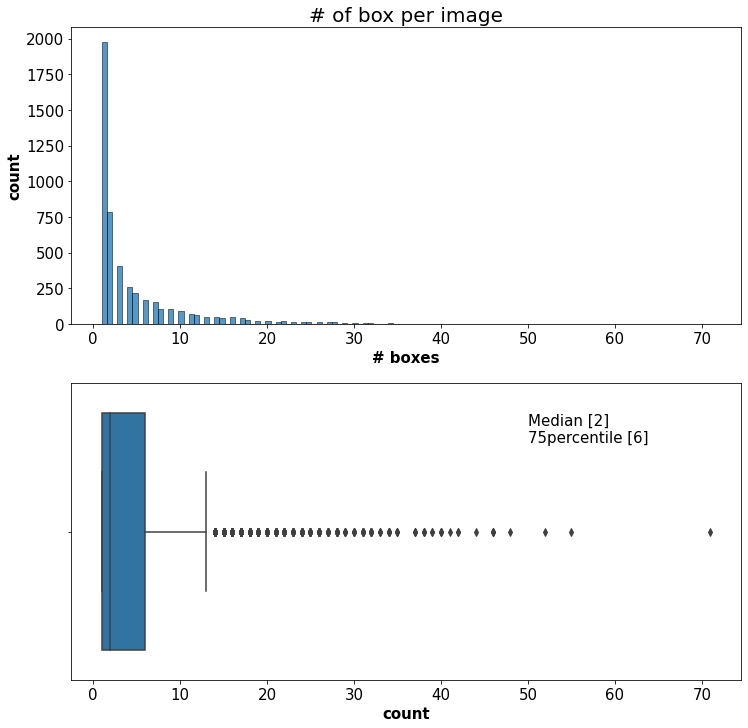

In [11]:
# plot - box per image
fig_box_per_img, ax_box_per_img = plt.subplots(2, 1, figsize=(12, 12))

sns.histplot(gt_df.img_id.value_counts(), ax=ax_box_per_img[0])
sns.boxplot(gt_df.img_id.value_counts(), ax=ax_box_per_img[1], orient='h')

ax_box_per_img[0].set_title('# of box per image', fontsize=20)

ax_box_per_img[0].set_xlabel('# boxes', weight='bold', fontsize=15)
ax_box_per_img[0].set_ylabel('count', weight='bold', fontsize=15)
ax_box_per_img[1].set_xlabel('count', weight='bold', fontsize=15)
ax_box_per_img[1].text(x=50, y=-0.3, s=f'Median [{2}] \n75percentile [{6}]', fontsize=15)

print(f'Simple distribution of box per img \n{gt_df.img_id.value_counts().describe()}')
gt_df.img_id.value_counts().sort_values()

### Sampling top 3 images which have the biggest number of boxes per image

### **Image # 4179 (Top 1)**

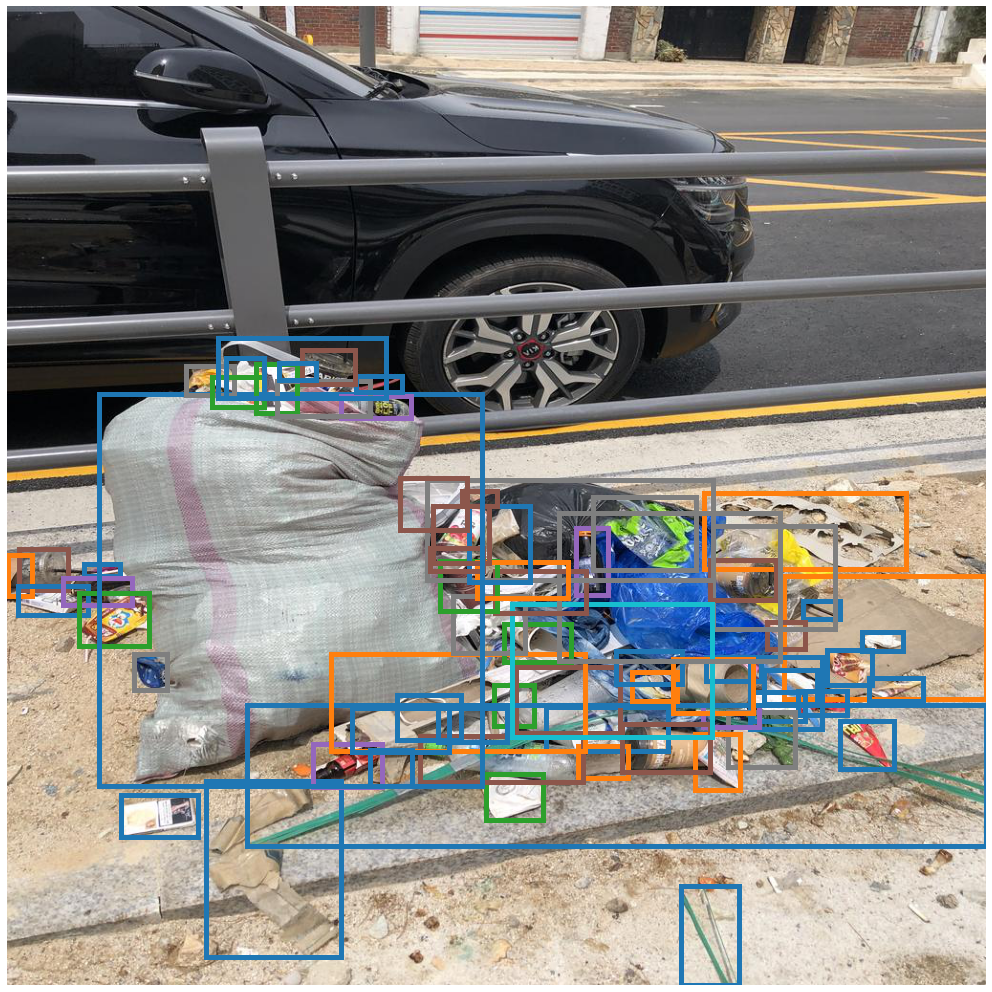

,img_id,label,x1,x2,y1,y2,area,cent_x,cent_y,width,height,label_nm
19857,train/4197.jpg,5,11.5,63.3,567.6,610.3,2211.86,37.40,588.95,51.8,42.7,Plastic
19858,train/4197.jpg,1,0.0,25.1,574.0,616.4,1064.24,12.55,595.20,25.1,42.4,Paper
19859,train/4197.jpg,0,80.3,117.5,583.6,595.5,442.68,98.90,589.55,37.2,11.9,General trash
19860,train/4197.jpg,0,11.2,83.7,605.7,636.7,2247.50,47.45,621.20,72.5,31.0,General trash
19861,train/4197.jpg,4,57.6,130.4,597.8,625.7,2031.12,94.00,611.75,72.8,27.9,Glass
...,...,...,...,...,...,...,...,...,...,...,...,...
19923,train/4197.jpg,0,228.6,268.6,368.0,408.9,1636.00,248.60,388.45,40.0,40.9,General trash
19924,train/4197.jpg,0,220.1,396.2,346.9,409.6,11041.47,308.15,378.25,176.1,62.7,General trash
19925,train/4197.jpg,0,365.0,413.1,386.8,403.1,784.03,389.05,394.95,48.1,16.3,General trash
19926,train/4197.jpg,5,307.8,363.7,358.9,394.5,1990.04,335.75,376.70,55.9,35.6,Plastic


In [12]:
img_w_all_bbox(4197)
gt_df[gt_df.img_id=='train/4197.jpg']

### **Image # 0946 (Top 2)**

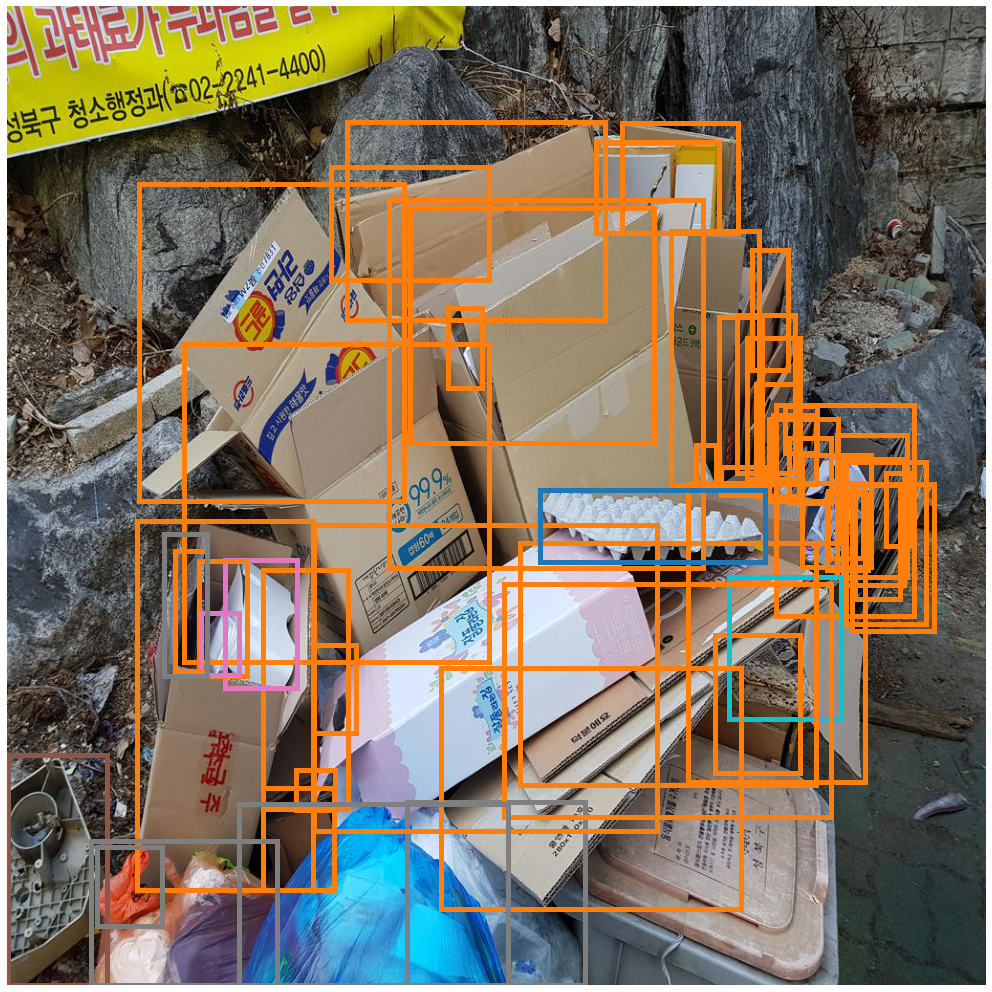

,img_id,label,x1,x2,y1,y2,area,cent_x,cent_y,width,height,label_nm
4515,train/0946.jpg,5,0.0,103.6,783.2,1023.6,24905.44,51.80,903.40,103.6,240.4,Plastic
4516,train/0946.jpg,1,267.4,341.3,817.8,923.8,7833.40,304.35,870.80,73.9,106.0,Paper
4517,train/0946.jpg,1,302.0,342.6,798.8,840.1,1676.78,322.30,819.45,40.6,41.3,Paper
4518,train/0946.jpg,1,267.2,356.1,589.9,839.1,22153.88,311.65,714.50,88.9,249.2,Paper
4519,train/0946.jpg,1,319.5,364.5,667.4,760.5,4189.50,342.00,713.95,45.0,93.1,Paper
4520,train/0946.jpg,1,184.4,503.6,353.2,685.4,106038.24,344.00,519.30,319.2,332.2,Paper
4521,train/0946.jpg,1,134.9,320.0,538.4,924.8,71522.64,227.45,731.60,185.1,386.4,Paper
4522,train/0946.jpg,7,86.9,281.9,872.6,1023.6,29445.00,184.40,948.10,195.0,151.0,Plastic bag
4523,train/0946.jpg,7,94.0,161.0,879.4,961.7,5514.10,127.50,920.55,67.0,82.3,Plastic bag
4524,train/0946.jpg,7,417.5,603.9,832.3,1023.6,35658.32,510.70,927.95,186.4,191.3,Plastic bag


In [13]:
img_w_all_bbox(946)
gt_df[gt_df.img_id=='train/0946.jpg']

### **Image # 4047 (Top 3)**

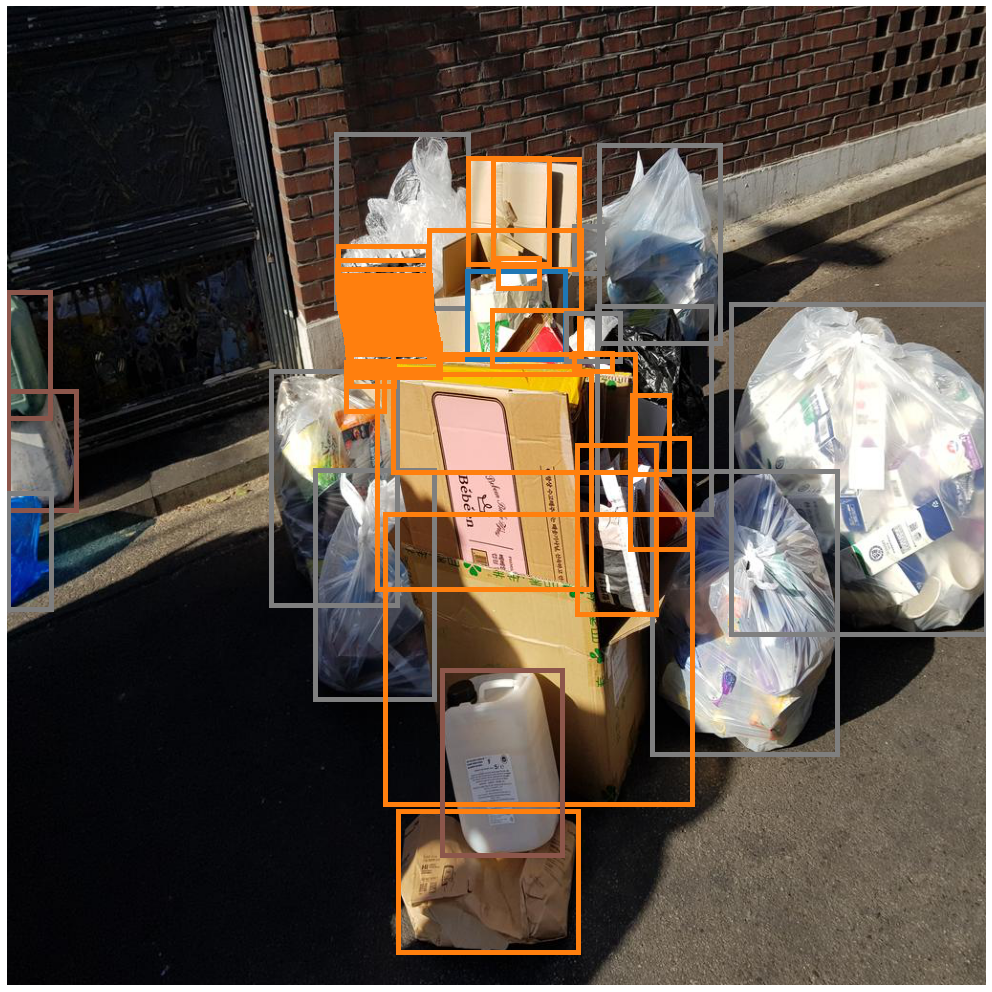

,img_id,label,x1,x2,y1,y2,area,cent_x,cent_y,width,height,label_nm
19144,train/4047.jpg,7,592.5,622.2,229.2,278.6,1467.18,607.35,253.90,29.7,49.4,Plastic bag
19145,train/4047.jpg,1,408.9,597.1,841.1,988.7,27778.32,503.00,914.90,188.2,147.6,Paper
19146,train/4047.jpg,7,275.3,407.9,381.6,626.4,32460.48,341.60,504.00,132.6,244.8,Plastic bag
19147,train/4047.jpg,7,322.0,446.2,484.6,724.0,29733.48,384.10,604.30,124.2,239.4,Plastic bag
19148,train/4047.jpg,1,353.8,394.2,371.8,422.6,2052.32,374.00,397.20,40.4,50.8,Paper
19149,train/4047.jpg,5,0.0,71.9,401.6,526.2,8958.74,35.95,463.90,71.9,124.6,Plastic
19150,train/4047.jpg,7,757.3,1023.7,311.2,656.6,92014.56,890.50,483.90,266.4,345.4,Plastic bag
19151,train/4047.jpg,7,674.0,868.0,486.3,781.9,57346.40,771.00,634.10,194.0,295.6,Plastic bag
19152,train/4047.jpg,1,651.4,712.9,451.4,567.9,7164.75,682.15,509.65,61.5,116.5,Paper
19153,train/4047.jpg,7,344.1,481.8,133.1,315.6,25130.25,412.95,224.35,137.7,182.5,Plastic bag


In [14]:
img_w_all_bbox(4047)
gt_df[gt_df.img_id=='train/4047.jpg']

/opt/conda/envs/detection/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


,count,ratio
label_nm,,
Paper,6352,39.949686
Plastic bag,5178,32.566038
General trash,3966,24.943396
Plastic,2943,18.509434
Styrofoam,1263,7.943396
Glass,982,6.176101
Metal,936,5.886792
Paper pack,897,5.641509
Clothing,468,2.943396


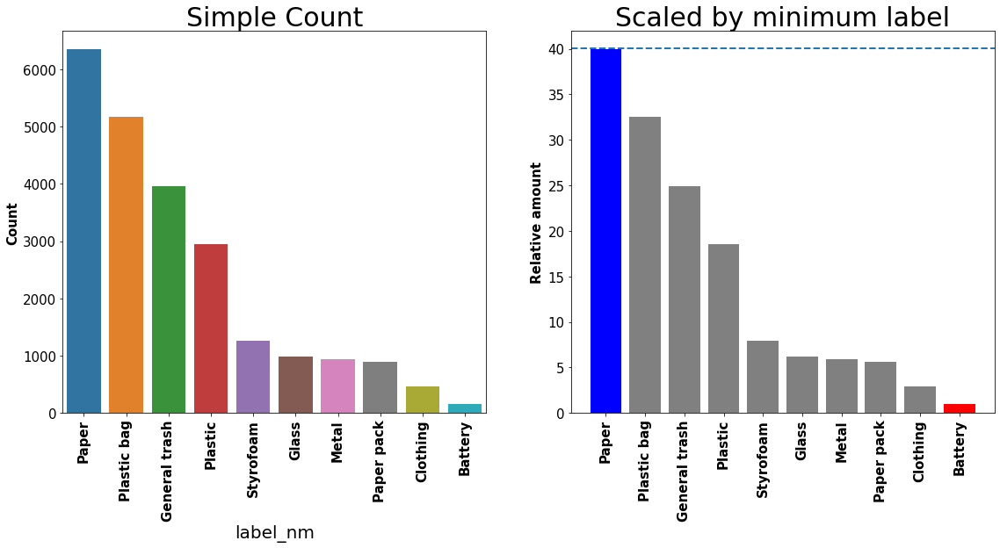

In [15]:
# plot - label imbalance
# sns.countplot(gt_df.label)
# gt_df.label_nm.value_counts().sort_values(ascending=False)

cnt_class = gt_df.label_nm.value_counts().sort_values(ascending=False)
cnt_class_scaled = cnt_class/cnt_class.min()

fig_trg_class, ax_trg_class = plt.subplots(1, 2, figsize=(19, 8))

sns.countplot(gt_df.label_nm, ax=ax_trg_class[0], order=gt_df.label_nm.value_counts().sort_values(ascending=False).index)

ax_trg_class[0].set_title('Simple Count', fontsize=30)
ax_trg_class[0].set_xticklabels(cnt_class.index, rotation=90, weight='bold', fontsize=15)
ax_trg_class[0].set_ylabel('Count', weight='bold', fontsize=15)

ax_trg_class[1].bar(x=cnt_class_scaled.index, height=cnt_class_scaled, color='grey')
ax_trg_class[1].bar(x=cnt_class_scaled.nsmallest(len(cnt_class_scaled)).index[0], height=cnt_class_scaled.nsmallest(len(cnt_class_scaled)).iat[0], color='red')
ax_trg_class[1].bar(x=cnt_class_scaled.nsmallest(len(cnt_class_scaled)).index[-1], height=cnt_class_scaled.nsmallest(len(cnt_class_scaled)).iat[-1], color='blue')
ax_trg_class[1].axhline(cnt_class_scaled.nsmallest(len(cnt_class_scaled)).iat[-1]+0.1, linestyle='--', linewidth=2)

ax_trg_class[1].set_ylabel('Relative amount', weight='bold', fontsize=15)
ax_trg_class[1].set_xticks(np.arange(0, 10))
ax_trg_class[1].set_title('Scaled by minimum label', fontsize=30)
ax_trg_class[1].set_xticklabels(cnt_class.index, rotation=90, weight='bold', fontsize=15)

cnt_class = pd.DataFrame(cnt_class)
cnt_class.index.name='label_nm'
cnt_class.columns=['count']
cnt_class['ratio']=cnt_class.apply(lambda x: x/x.min())
cnt_class

<AxesSubplot:xlabel='y2', ylabel='Count'>

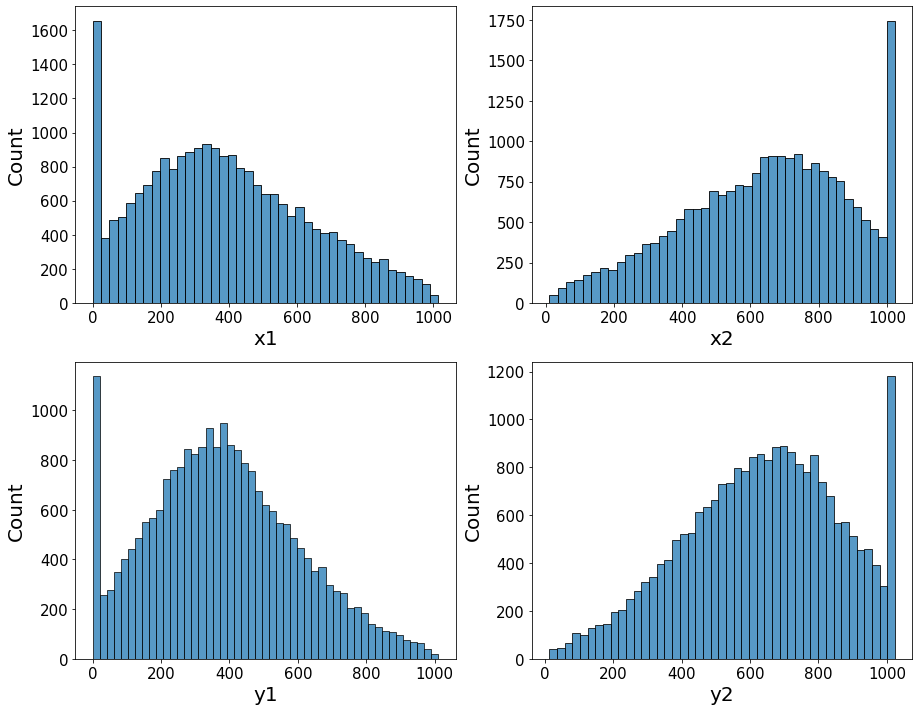

In [16]:
# Plot - distribution of coordinates
fig_corrd, ax_corrd = plt.subplots(2, 2, figsize=(15, 12))

# sns.set(font_scale=1.5)

sns.histplot(gt_df.x1, ax=ax_corrd[0, 0])
sns.histplot(gt_df.x2, ax=ax_corrd[0, 1])
sns.histplot(gt_df.y1, ax=ax_corrd[1, 0])
sns.histplot(gt_df.y2, ax=ax_corrd[1, 1])

### **Observation & Insight**
>bbox의 꼭지점 좌표값인 x1, x2, y1, y2 모두 극단적인 값에서 높은 수치를 보여, 사진을 촬영할 때 피사체를 중심에 둘 것이라는 예상과 벗어나는 결과를 보였음. 이는 실제 bbox를 image.jpg위에 그려 눈으로 확인해봐야 할 것으로 생각됨. 이런 끝값의 높은 수치가 모델 성능에 미칠 영향은 예상하기 어려우나, 데이터 수집 과정에서 예상치 못한 부분이 있을 가능성을 시사함

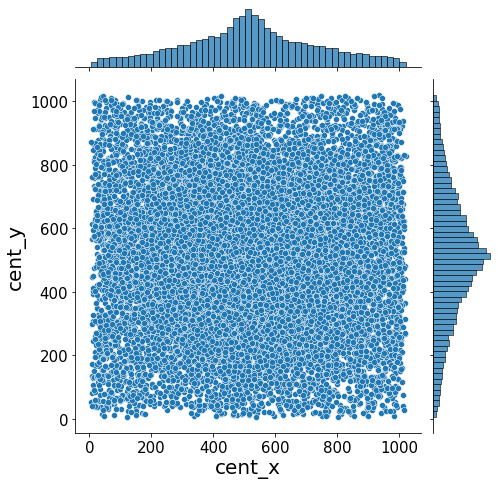

In [17]:
# Plot - center coordinates by jointplot
sns.jointplot(x='cent_x', y='cent_y', data=gt_df, height=7)

### **Observation & Insight**
>bbox의 중심 좌표는 x축과 y축 모두 gaussian distribution의 형태를 보임. 이는 사진을 촬영할 때 피사체를 사진의 중심에 둘 것이라는 직관적인 예상에 부합하는 결과로 볼 수 있음. 다만, x축 y축 모두 양극단에 값들이 존재하는데, 이는 지나치게 작은 형태의 box이거나 width, height 중 하나가 극단적으로 작은 경우일 수 있어 모델의 예측력에 부정적인 영향을 미칠 가능성이 예상됨. 이에 따라 에러 분석에서 오답 샘플링시 연관성을 자세히 살펴야 할 것으로 보임

5159        0.7
6539        1.3
13598       7.1
20511       8.4
1524        8.5
          ...  
10443    1023.8
7810     1023.8
13981    1023.8
4512     1023.9
5565     1023.9
Name: width, Length: 23144, dtype: float64
5159        0.8
6539        2.4
17594       5.3
11349       7.2
5234        7.4
          ...  
20006    1023.8
4272     1023.8
11449    1023.8
5428     1023.8
5565     1023.9
Name: height, Length: 23144, dtype: float64


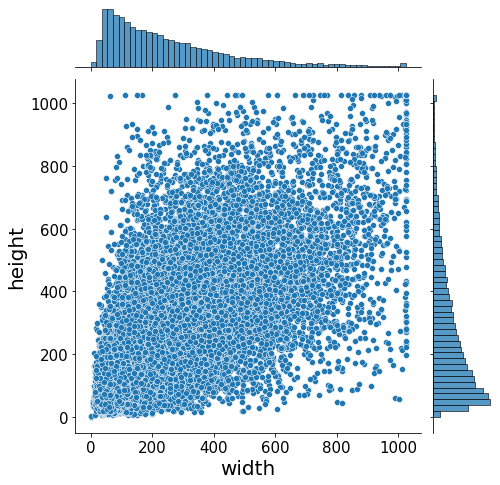

In [18]:
# Plot - width and height by jointplot
sns.jointplot(x='width', y='height', data=gt_df, height=7)
print(gt_df.width.sort_values())
print(gt_df.height.sort_values())

### **Observation & Insight**
> Width, height 모두 작은 값에 편향되어 있음. 이미지 크기에 비해 대부분의 bbox가 상당히 작은 것으로 보임. 특히, 0에 가까운 width, height도 관찰되는데, 이는 모델이 예측하기 어려울 것으로 예상됨. 또, 극단적으로 큰 크기를 보이는 bbox도 관찰되며, width, height 둘 중 하나의 값이 다른 하나에 비해 지나치게 큰 경우도 관찰됨

### Width, Height가 모두 극단적으로 작은 box가 존재하는 sample image
<!-- 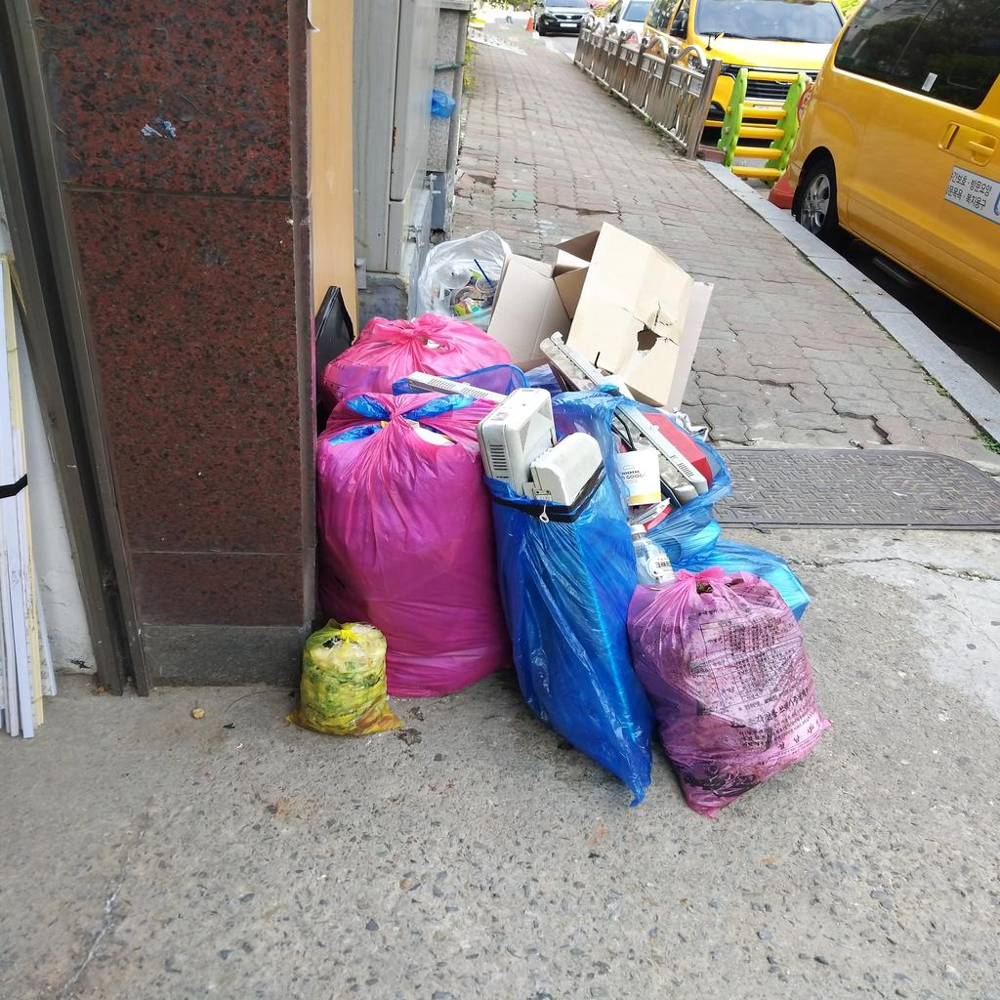 -->
bbox가 너무 작아 육안으로 확인이 되지 않으며 bbox를 그리는 것도 쉽지 않음

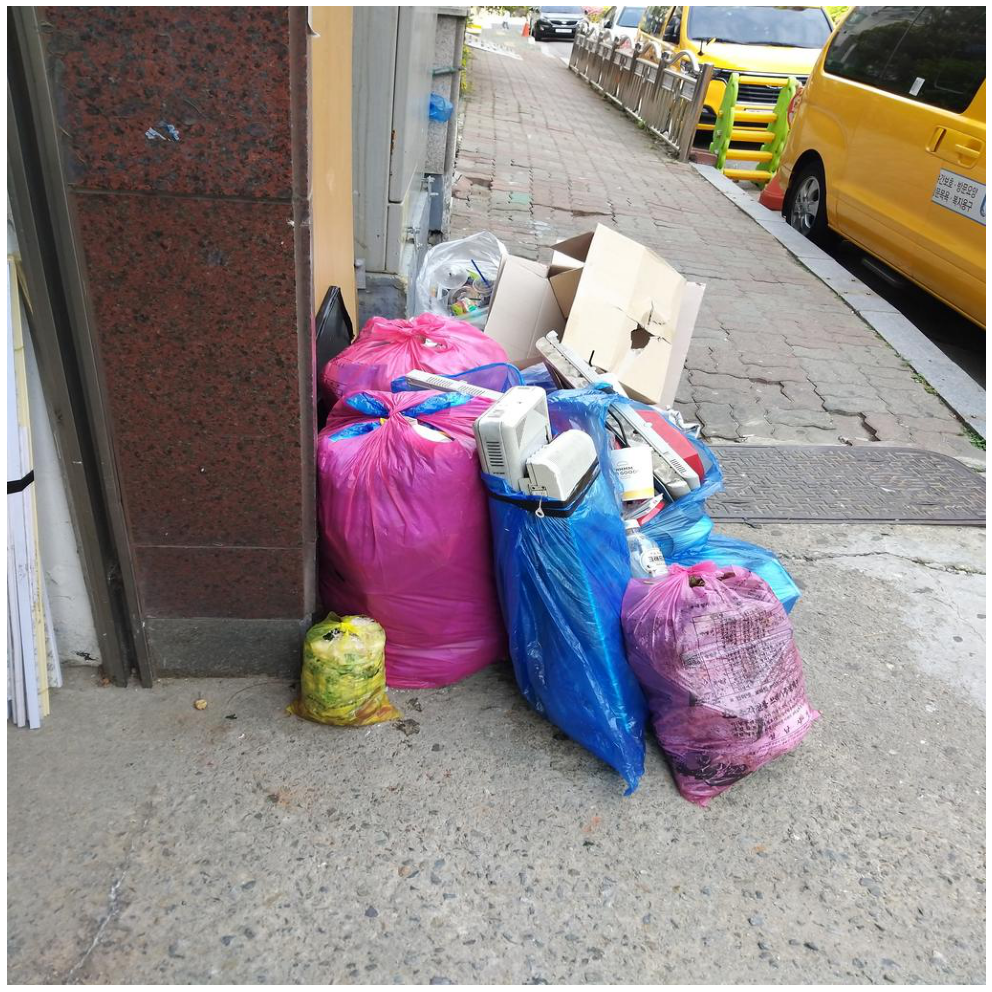

img_id      train/1063.jpg
label                    0
x1                   647.8
x2                   648.5
y1                   460.2
y2                   461.0
area                  0.56
cent_x              648.15
cent_y               460.6
width                  0.7
height                 0.8
label_nm     General trash
Name: 5159, dtype: object

In [19]:
img_w_bbox(gt_df.loc[5159, :], linewidth=10, edgecolor='purple', facecolor='purple')
gt_df.loc[5159, :]

### Width, Height가 모두 극단적으로 큰 box가 존재하는 sample image
화면 전체를 Plastic bag 처리한 것을 확인할 수 있음
<!-- 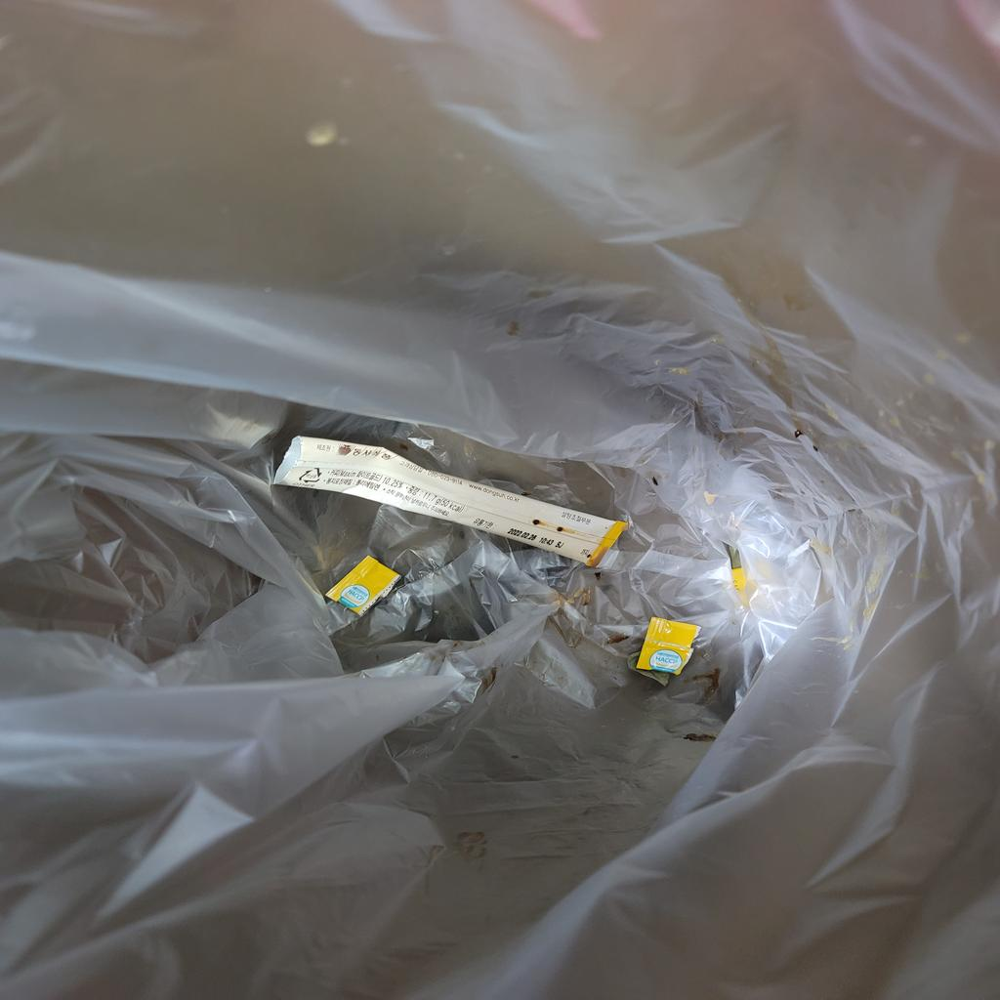 -->

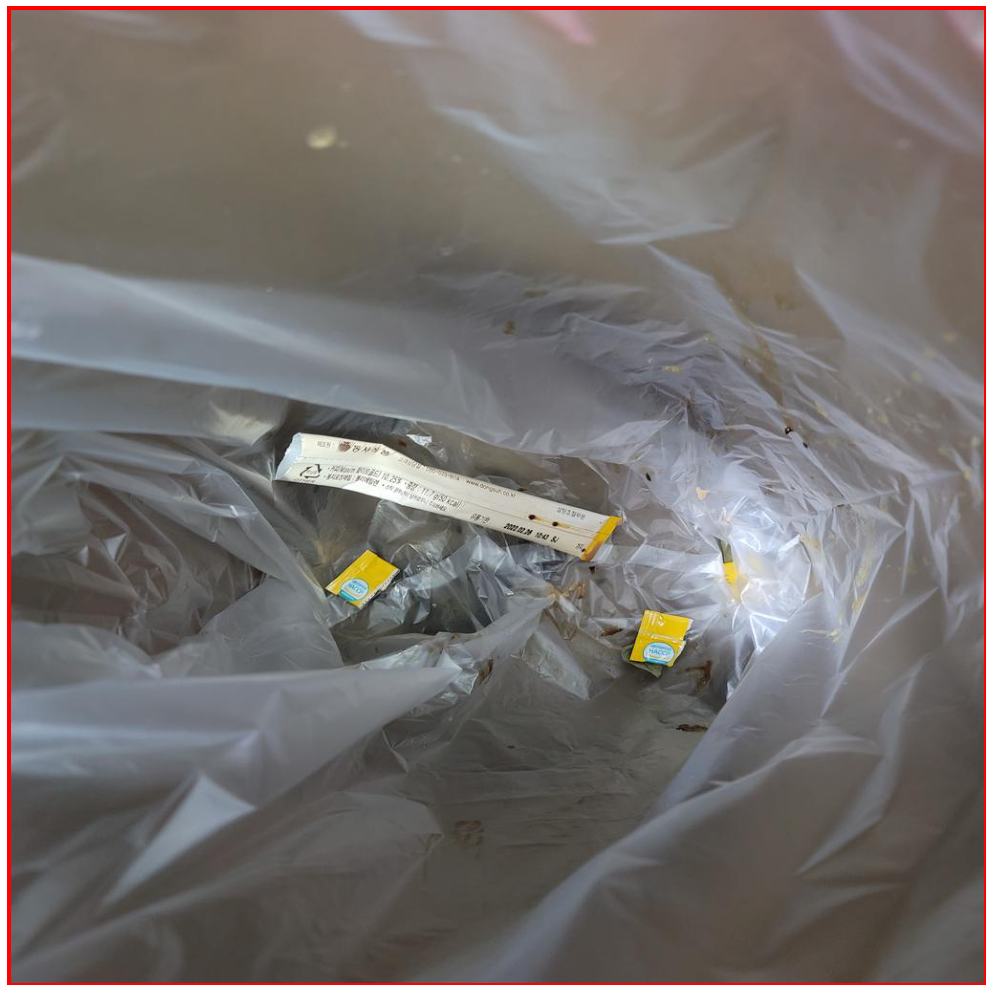

img_id      train/1160.jpg
label                    7
x1                     0.0
x2                  1023.9
y1                     0.0
y2                  1023.9
area            1048371.21
cent_x              511.95
cent_y              511.95
width               1023.9
height              1023.9
label_nm       Plastic bag
Name: 5565, dtype: object

In [23]:
img_w_bbox(gt_df.loc[5565, :])
gt_df.loc[5565, :]

### Width, Height의 차이가 상대적으로 큰 경우
해당 경우는 문제가 된다고 보기 어려운 사례로 판단됨

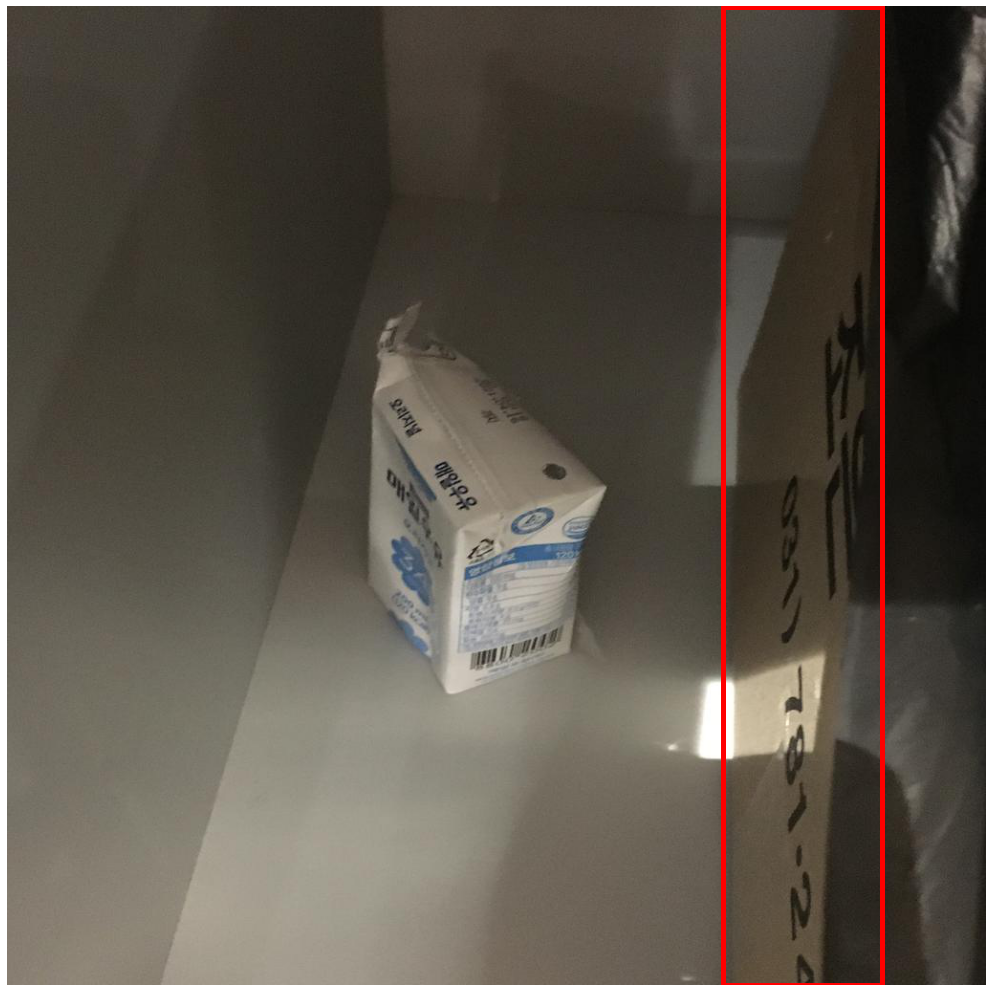

img_id      train/0072.jpg
label                    1
x1                   749.0
x2                   914.6
y1                     0.0
y2                  1023.7
area             169524.72
cent_x               831.8
cent_y              511.85
width                165.6
height              1023.7
label_nm             Paper
Name: 358, dtype: object

In [21]:
img_w_bbox(gt_df.loc[358, :])
gt_df.loc[358, :]